In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm import tqdm

import subprocess

plt.style.use('ggplot')

# Converting video types(From mov to mp4{as required in this project})
Used ffmpeg to convert mov to mp4. Read more in the documentation here: https://ffmpeg.org/ffmpeg.html

In [45]:
input_file = '/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/00225f53-67614580.mov'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '00225f53-67614580.mp4']
              )

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

CompletedProcess(args=['ffmpeg', '-i', '/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/00225f53-67614580.mov', '-qscale', '0', '00225f53-67614580.mp4'], returncode=0)

In [46]:
!ls -GFlash --color 

total 63M
4.0K drwxr-xr-x 3 root 4.0K May  3 21:18 ./
4.0K drwxr-xr-x 5 root 4.0K May  3 20:54 ../
4.0K drwxr-xr-x 2 root 4.0K May  3 20:54 .virtual_documents/
 16M -rw-r--r-- 1 root  16M May  3 20:57 0004974f-05e1c285.mp4
 17M -rw-r--r-- 1 root  17M May  3 21:14 00067cfb-caba8a02.mp4
 11M -rw-r--r-- 1 root  11M May  3 21:16 0010bf16-9ee17cd9.mp4
 20M -rw-r--r-- 1 root  20M May  3 21:19 00225f53-67614580.mp4
260K -rw-r--r-- 1 root 257K May  3 20:56 026c7465-309f6d33.mp4


# Displaying Video (Taking video of a survillieance cam inside a car)

In [47]:
# Taking video of a survillieance cam inside a car
ipd.Video('00225f53-67614580.mp4', width=700)


# Preprocessing the mp4 video
Opening the Video and Reading Metadata

In [48]:
# Loaded in video capture mode
cap = cv2.VideoCapture('00225f53-67614580.mp4')

In [83]:
cap = cv2.VideoCapture("00225f53-67614580.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f'No. of frames = {n_frames}')

No. of frames = 2409


In [53]:
# Video height and width
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')

Height 720.0, Width 1280.0


In [54]:
# Frames per second
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS : {fps:0.2f}')

FPS : 60.00


In [56]:
cap.release()

# Visulaising Images from Video 

In [57]:
cap = cv2.VideoCapture('00225f53-67614580.mp4')
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (720, 1280, 3)


In [59]:
# This is a Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

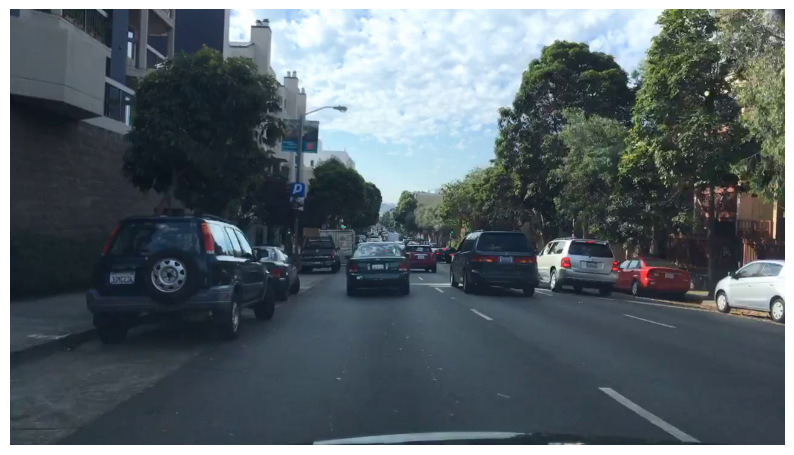

In [60]:
display_cv2_img(img)

In [61]:
#Closing the video capture mode
cap.release()

# Displaying multiple frames from the video

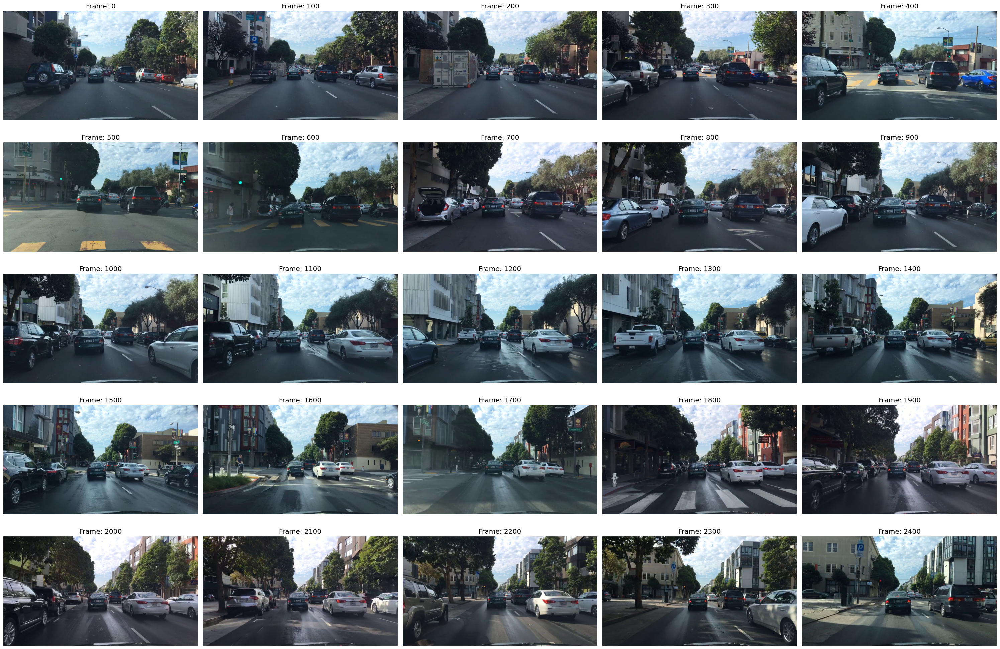

In [62]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("00225f53-67614580.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

# Adding Annotations to Video Frames

In [63]:
labels = pd.read_csv('../input/driving-video-with-object-tracking/mot_labels.csv',
                     low_memory=False)
video_labels = (
    labels.query('videoName == "00225f53-67614580"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

In [64]:
video_labels["category"].value_counts()

category
car           2029
truck          147
pedestrian     145
motorcycle      55
rider           54
bus              9
Name: count, dtype: int64

In [65]:
# Visualizing frame 1035

cap = cv2.VideoCapture("00225f53-67614580.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

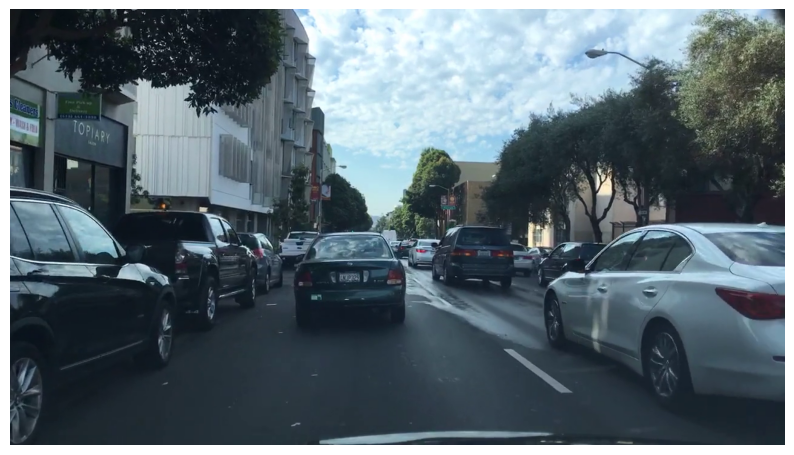

In [66]:
display_cv2_img(img)

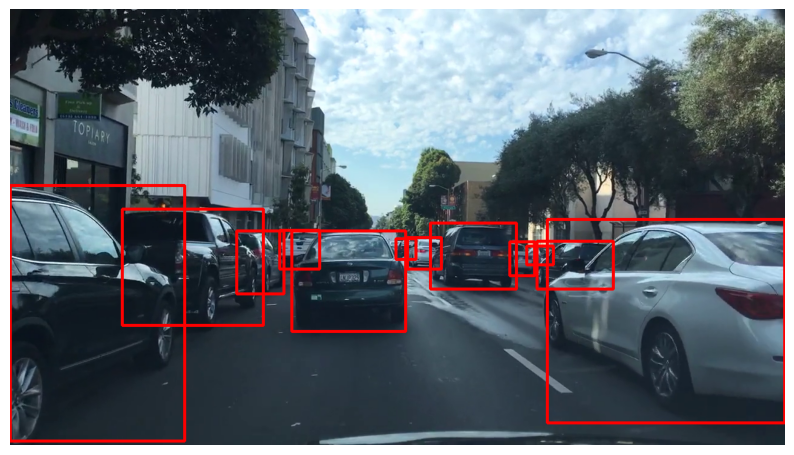

In [67]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)

display_cv2_img(img_example)

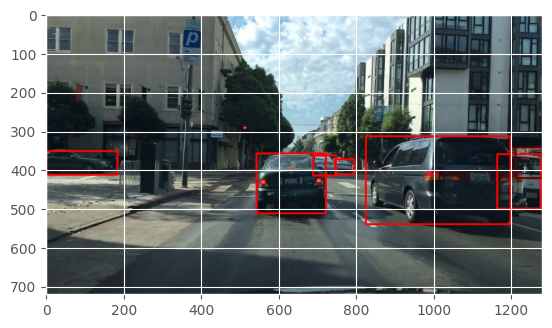

In [91]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

# Displaying A Specific box size coordinates

In [72]:
pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
pt2 = int(d['box2d.x2']), int(d['box2d.y2'])

box_width = abs(pt2[0] - pt1[0])
box_height = abs(pt2[1] - pt1[1])

# Printing box sizes
print(f'Box Width: {box_width}')
print(f'Box Height: {box_height}')

# Printing coordinates of pt1 and pt2
print(f'pt1 Coordinates: ({pt1[0]}, {pt1[1]})')
print(f'pt2 Coordinates: ({pt2[0]}, {pt2[1]})')

Box Width: 44
Box Height: 31
pt1 Coordinates: (853, 391)
pt2 Coordinates: (897, 422)


# Displaying Colored boxes by Category

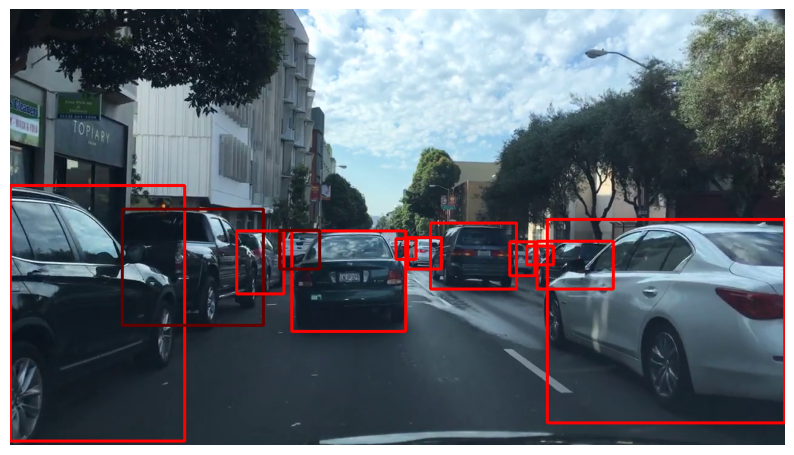

In [73]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)

## Adding Text Over Boxes(What object does the box identify)

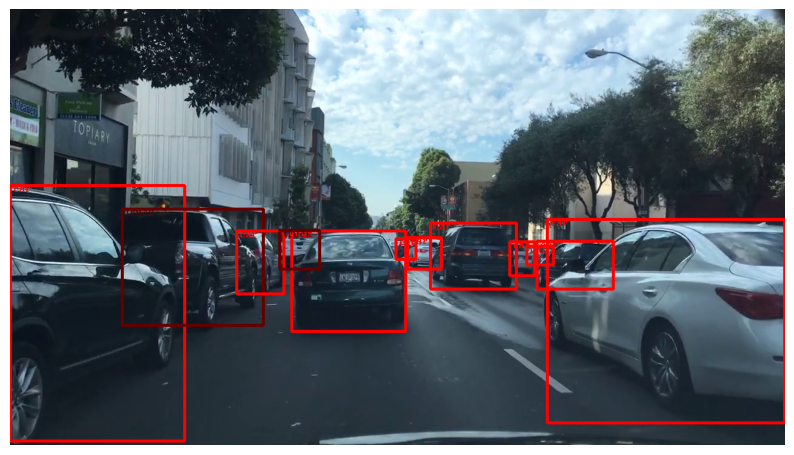

In [74]:
frame_labels = video_labels.query("video_frame == @frame")
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)
display_cv2_img(img_example)
cap.release()

# Labeled and outputting Annotated Video

In [75]:
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img

In [76]:
!rm -r out_test.mp4

rm: cannot remove 'out_test.mp4': No such file or directory


In [78]:
VIDEO_CODEC = "mp4v"
fps = 60
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                fps,
                (width, height))

cap = cv2.VideoCapture("00225f53-67614580.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    img = add_annotations(img, frame, video_labels)
    out.write(img)
out.release()
cap.release()

100%|██████████| 2409/2409 [00:46<00:00, 51.27it/s]


In [84]:
!ls -GFlash -color

total 148M
 85M -rw-r--r-- 1 root  85M May  3 21:30 out_test.mp4
260K -rw-r--r-- 1 root 257K May  3 20:56 026c7465-309f6d33.mp4
 20M -rw-r--r-- 1 root  20M May  3 21:19 00225f53-67614580.mp4
 11M -rw-r--r-- 1 root  11M May  3 21:16 0010bf16-9ee17cd9.mp4
 17M -rw-r--r-- 1 root  17M May  3 21:14 00067cfb-caba8a02.mp4
 16M -rw-r--r-- 1 root  16M May  3 20:57 0004974f-05e1c285.mp4
4.0K drwxr-xr-x 2 root 4.0K May  3 20:54 .virtual_documents/
4.0K drwxr-xr-x 5 root 4.0K May  3 20:54 ../
4.0K drwxr-xr-x 3 root 4.0K May  3 21:29 ./


# Converting our labeled output to mp4 and view

In [87]:
tmp_output_path = "out_test.mp4"
output_path = "final.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        
    ]
)

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'final.mp4'], returncode=0)

In [88]:
!ls -GFlash --color

total 204M
4.0K drwxr-xr-x 3 root 4.0K May  3 21:33 ./
4.0K drwxr-xr-x 5 root 4.0K May  3 20:54 ../
4.0K drwxr-xr-x 2 root 4.0K May  3 20:54 .virtual_documents/
 16M -rw-r--r-- 1 root  16M May  3 20:57 0004974f-05e1c285.mp4
 17M -rw-r--r-- 1 root  17M May  3 21:14 00067cfb-caba8a02.mp4
 11M -rw-r--r-- 1 root  11M May  3 21:16 0010bf16-9ee17cd9.mp4
 20M -rw-r--r-- 1 root  20M May  3 21:19 00225f53-67614580.mp4
260K -rw-r--r-- 1 root 257K May  3 20:56 026c7465-309f6d33.mp4
 40M -rw-r--r-- 1 root  40M May  3 21:34 final.mp4
 85M -rw-r--r-- 1 root  85M May  3 21:30 out_test.mp4
 17M -rw-r--r-- 1 root  17M May  3 21:32 out_test_compressed.mp4


# Final mp4 video with annonations

In [89]:
ipd.Video('final.mp4', width=600)

# Making Final Video Stabilized(Video Stabiliztion)

In [ ]:
import cv2
import numpy as np

# Initialize video capture
cap = cv2.VideoCapture('final.mp4')

# Get video properties
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Initialize video writer for stabilized output
out = cv2.VideoWriter('stabilized_output.mp4', 
                      cv2.VideoWriter_fourcc(*'mp4v'), 
                      fps, 
                      (width, height))

# Parameters for Lucas-Kanade optical flow
lk_params = dict(
    winSize=(15, 15),
    maxLevel=2,
    criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03)
)

# Read the first frame
ret, prev_frame = cap.read()
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

# Initialize transformation matrix
transform = np.eye(2, 3, dtype=np.float32)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Calculate optical flow using Lucas-Kanade method
    new_points, status, _ = cv2.calcOpticalFlowPyrLK(prev_gray, gray, 
                                                     np.array([[[x, y]] for x, y in prev_points], dtype=np.float32), 
                                                     None, **lk_params)
    
    # Filter out points with low status
    prev_points = prev_points[status == 1]
    new_points = new_points[status == 1]

    # Calculate transformation matrix using RANSAC
    transform = cv2.estimateAffinePartial2D(prev_points, new_points)[0]

    # Apply transformation to stabilize frame
    stabilized_frame = cv2.warpAffine(frame, transform, (width, height))

    # Update previous frame and points
    prev_frame = frame
    prev_gray = gray
    prev_points = new_points.reshape(-1, 1, 2)

    out.write(stabilized_frame)

# Release resources
cap.release()
out.release()


# The End